# Copied from Alex's folder 4/6/2020

originally at: /home/iachaim/notebooks/10X/APOBEC/02_02_Subsetting_on_non_APO_overlap/02_02_RPS2_expression-lenti.ipynb

In [20]:
import numpy as np
import pandas as pd
import scanpy as sc
from matplotlib import rcParams
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import os
import matplotlib.patches as mpatches
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=150, dpi_save=600, vector_friendly=True)
sc.logging.print_versions()

rcParams['figure.figsize'] = 3,3

scanpy==1.4.5.1 anndata==0.7.1 umap==0.3.10 numpy==1.18.1 scipy==1.4.1 pandas==1.0.1 scikit-learn==0.22.1 statsmodels==0.10.0rc2 python-igraph==0.7.1 louvain==0.6.1


In [2]:
import matplotlib
from matplotlib import rc

from scipy.cluster.hierarchy import dendrogram, set_link_color_palette
from scipy.cluster import hierarchy
from scipy.spatial import distance

import os

In [3]:
fn = '/home/bay001/projects/kris_apobec_20200121/permanent_data2/03_scRNA/inputs/02_02_RPS2_expression-lenti.h5ad'
input_dir = '/home/bay001/projects/kris_apobec_20200121/permanent_data2/03_scRNA/inputs/'
output_dir = '/home/bay001/projects/kris_apobec_20200121/permanent_data2/03_scRNA/outputs/'

In [4]:
adata = sc.read(fn)

In [5]:
adata

AnnData object with n_obs × n_vars = 3941 × 2000 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'louvain', 'louvain_r08', 'louvain_r0.5', 'louvain_r0.2', '__is_in_cluster__', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_louvain_r0.5', 'dendrogram_phase', 'louvain', 'louvain_colors', 'louvain_r0.2_colors', 'louvain_r0.5_colors', 'louvain_r08_colors', 'neighbors', 'pca', 'phase_colors', 'rank_genes_groups', 'rank_genes_groups_filtered'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [6]:
cell_cycle_genes = pd.read_csv(os.path.join(input_dir, 'Macosko_cell_cycle_genes.csv'))
cell_cycle_genes.fillna(-1, inplace=True)
cell_cycle_genes.head()

,IG1.S,S,G2M,M,M.G1
0,ACD,ABCC5,ANLN,AHI1,AGFG1
1,ACYP1,ABHD10,AP3D1,AKIRIN2,AGPAT3
2,ADAMTS1,ANKRD18A,ARHGAP19,ANKRD40,AKAP13
3,ANKRD10,ASF1B,ARL4A,ANLN,AMD1
4,APEX2,ATAD2,ARMC1,ANP32B,ANP32E


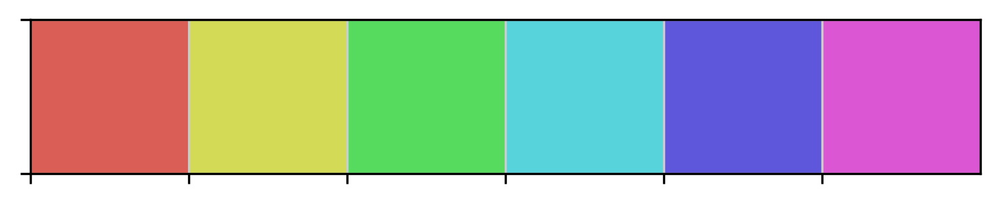

In [7]:
sns.palplot(sns.color_palette("hls", 6))
COLORS = sns.color_palette("hls", 6)

In [21]:
def assign_celltype_colors(row, cell_cycle_genes=cell_cycle_genes):
    genename = row['index']
    # IG1_S_phase_genes = set(dict(cell_cycle_genes)['IG1.S'])
    S_phase_genes = set(dict(cell_cycle_genes)['S'])
    G2M_phase_genes = set(dict(cell_cycle_genes)['G2M'])
    # M_phase_genes = set(dict(cell_cycle_genes)['M'])
    MG1_phase_genes = set(dict(cell_cycle_genes)['M.G1'])
    
    if genename in S_phase_genes:
        return COLORS[3] # light blue
    elif genename in G2M_phase_genes:
        return COLORS[0] # red
    elif genename in MG1_phase_genes:
        return COLORS[5] # purple
    else:
        return 'white'

In [23]:
light_blue_patch = mpatches.Patch(color=COLORS[3], label='S-phase')
red_patch = mpatches.Patch(color=COLORS[0], label='G2M-phase')
purple_patch = mpatches.Patch(color=COLORS[5], label='G1-phase')

In [17]:
genenames = pd.DataFrame(adata.var.index, columns=['index'])
genenames['colors'] = genenames.apply(assign_celltype_colors, axis=1)
genenames.set_index('index', inplace=True)
genenames['colors'].value_counts()

white                                              1940
(0.86, 0.3712, 0.33999999999999997)                  32
(0.33999999999999997, 0.8287999999999999, 0.86)      16
(0.3712, 0.33999999999999997, 0.86)                  12
Name: colors, dtype: int64

In [10]:
phase_assignments = adata.obs[['phase']]
# phase_assignments['color'] = phase_assignments.apply(assign_colors, axis=1)
phase_assignments.head()

,phase
index,
AAACCCACAGGTACGA-1,G1
AAACCCACAGTTCACA-1,S
AAACCCAGTTCCGCAG-1,G2M
AAACCCATCCTAGCCT-1,G1
AAACGAAAGGGATGTC-1,G2M


# DOUBLE CHECK the values against another notebook
- transforming adata to dataframe without thoroughly checking transformation. Please check one or two values for a gene/barcode or two to make sure we aren't accidentally munging data

In [11]:
df = pd.DataFrame(adata.X, index=list(adata.obs.index), columns=list(adata.var.index))
df = pd.merge(phase_assignments, df, how='outer', left_index=True, right_index=True)
df.head()

,phase,AL627309.1,FAM87B,LINC00115,SAMD11,HES4,ISG15,MXRA8,ATAD3C,C1orf233,...,S100B,MT-ND1,MT-ND2,MT-ATP8,MT-ND3,MT-ND4L,MT-ND4,MT-ND5,MT-ND6,SRSF10-1
index,,,,,,,,,,,,,,,,,,,,,
AAACCCACAGGTACGA-1,G1,-0.017971,-0.034770,-0.158795,1.874731,0.330989,2.915736,-0.064715,-0.086691,0.475391,...,-0.016863,-0.262732,-0.173545,1.789603,0.039717,0.631339,-0.456414,0.946342,-0.228307,-0.110964
AAACCCACAGTTCACA-1,S,-0.006767,-0.038297,-0.155862,0.652826,0.310001,1.293966,-0.062073,-0.081593,1.158416,...,-0.013613,0.194007,-0.107440,1.332728,-0.619734,0.892525,0.774921,1.864058,-0.943089,-0.100379
AAACCCAGTTCCGCAG-1,G2M,0.012037,-0.041830,-0.142197,0.404591,-1.448343,-0.486708,-0.051521,-0.071208,0.095068,...,-0.006514,-0.200400,1.307019,0.318379,0.797388,0.583590,0.217369,-0.000150,0.879968,-0.092189
AAACCCATCCTAGCCT-1,G1,0.009873,-0.032050,-0.109462,0.184758,0.321741,-0.473103,-0.028726,-0.065232,-0.844476,...,-0.000874,-0.195535,0.313463,0.729980,0.046880,1.244845,-0.022591,0.225633,1.079931,-0.130717
AAACGAAAGGGATGTC-1,G2M,-0.017377,-0.034674,-0.157604,0.017365,0.300452,-0.457053,-0.063850,-0.086205,-0.799464,...,-0.016495,-0.577998,-0.833023,0.389806,-0.468766,0.864846,0.287611,0.829637,-0.246842,-0.111538


In [12]:
df_g1 = df[df['phase']=='G1']
df_g2m = df[df['phase']=='G2M']
df_s = df[df['phase']=='S']

del df_g1['phase']
del df_g2m['phase']
del df_s['phase']
print(df_g1.shape, df_g2m.shape, df_s.shape)

(1093, 2000) (1310, 2000) (1538, 2000)


# Using native seaborn function

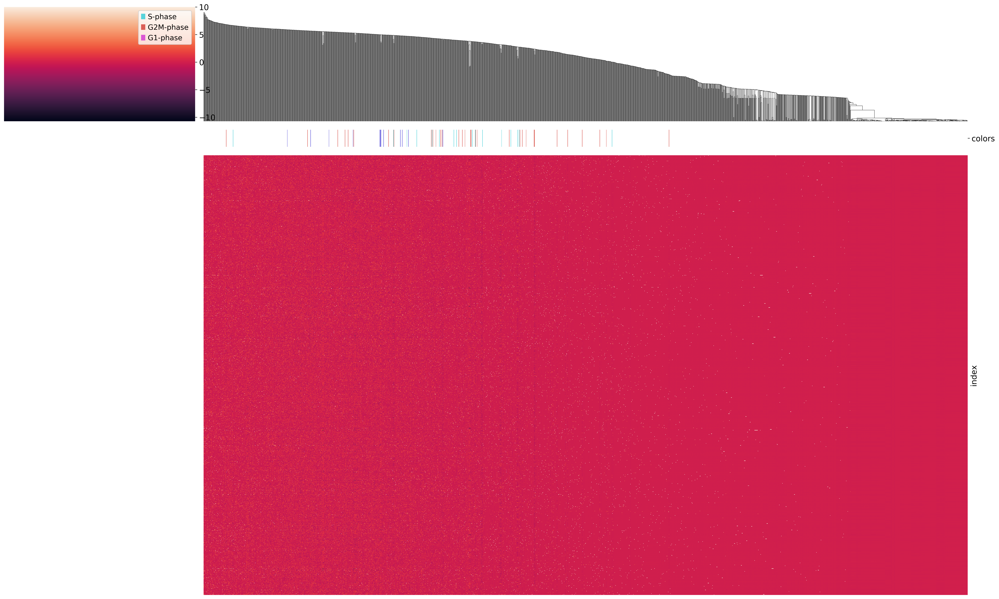

In [25]:
g = sns.clustermap(
    df_g1, 
    col_cluster=True, 
    row_cluster=False,
    xticklabels=False, 
    yticklabels=False, 
    figsize=(25, 15), 
    col_colors=genenames['colors']
)
plt.legend(handles=[light_blue_patch, red_patch, purple_patch])
plt.tight_layout()
g.savefig(os.path.join(output_dir, 'G1_cells_clustered_by_expression.png'))

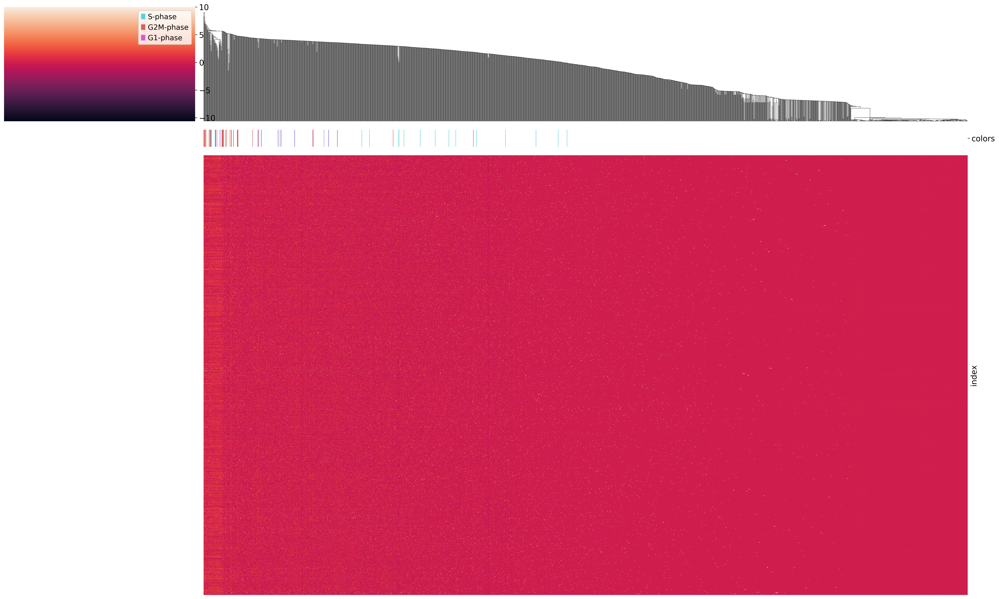

In [26]:
g = sns.clustermap(
    df_g2m, 
    col_cluster=True, 
    row_cluster=False,
    xticklabels=False, 
    yticklabels=False, 
    figsize=(25, 15), 
    col_colors=genenames['colors']
)
plt.legend(handles=[light_blue_patch, red_patch, purple_patch])
plt.tight_layout()
g.savefig(os.path.join(output_dir, 'G2M_cells_clustered_by_expression.png'))

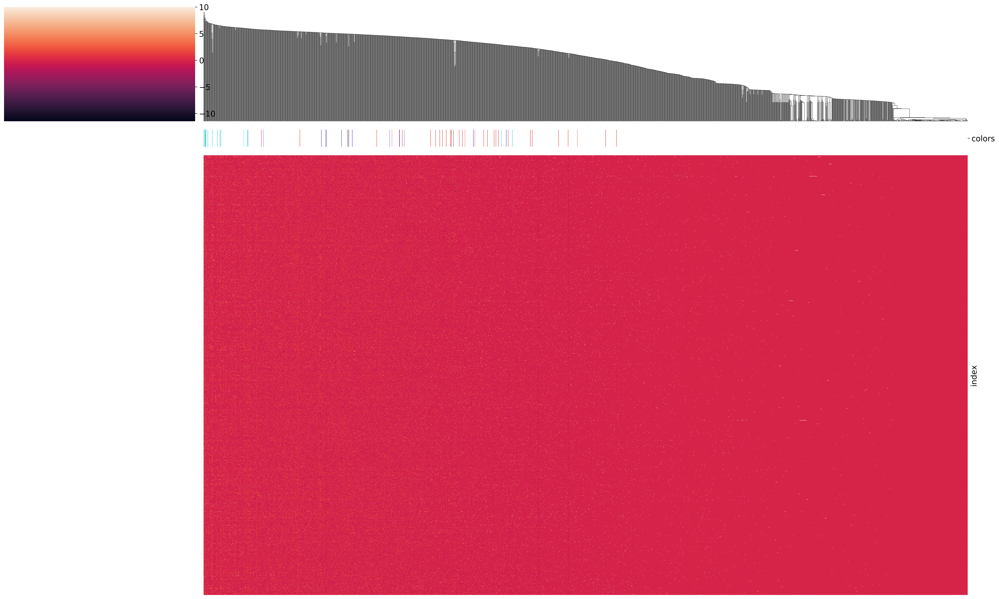

In [27]:
g = sns.clustermap(
    df_s, 
    col_cluster=True, 
    row_cluster=False,
    xticklabels=False, 
    yticklabels=False, 
    figsize=(25, 15), 
    col_colors=genenames['colors']
)
plt.tight_layout()
g.savefig(os.path.join(output_dir, 'S_cells_clustered_by_expression.png'))